In [28]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import matplotlib.animation as animation
from IPython.display import HTML

#### Part I

In [29]:
## Load points 

with open('points.pkl', 'rb') as file:
    loaded_data = pickle.load(file)

blue_points = loaded_data['blue_points']
black_points = loaded_data['black_points']

1.2 Define Camera Parameters

* Camera center: C = (0, 0, 0) (at origin)
* Focal lengths to test: f = 10, 50, 100
* Standard image plane: Z = f (perpendicular to Z-axis)
* Tilted image plane: ax + by + cz + d = 0 (e.g., x + 0.5z + f = 0)

In [30]:
# Camera parameters
camera_center = np.array([0, 0, 0])  # C = (0, 0, 0)
focal_lengths = [10, 50, 100]        # Different f values to test

### Step 2: Ray-Plane Intersection Functions

**Standard Plane (Z = Z₀):**

In [31]:
def project_standard_plane(points, camera_center, z0):
    """Project points onto Z = z0 plane"""
    C = camera_center
    # t = (z0 - Cz) / (Z - Cz)
    t = (z0 - C[2]) / (points[:, 2] - C[2])
    
    Ix = C[0] + t * (points[:, 0] - C[0])
    Iy = C[1] + t * (points[:, 1] - C[1])
    
    return np.column_stack([Ix, Iy])

**Tilted Plane (ax + by + cz + d = 0):**

In [32]:
def project_tilted_plane(points, camera_center, a, b, c, d):
    """Project points onto tilted plane ax + by + cz + d = 0"""
    C = camera_center
    dx = points[:, 0] - C[0]
    dy = points[:, 1] - C[1]
    dz = points[:, 2] - C[2]
    
    numerator = -(a*C[0] + b*C[1] + c*C[2] + d)
    denominator = a*dx + b*dy + c*dz
    
    t = numerator / denominator
    
    Ix = C[0] + t * dx
    Iy = C[1] + t * dy
    Iz = C[2] + t * dz
    
    return np.column_stack([Ix, Iy, Iz])

### Step 3 & 4: Map to 2D Image Coordinates


In [33]:
def map_to_image_coords(projected_points, cx=0, cy=0):
    """Map to 2D pixel coordinates (u, v)"""
    # u = Ix + cx, v = Iy + cy (with sx=sy=1, Ox=Oy=0)
    u = projected_points[:, 0] + cx
    v = projected_points[:, 1] + cy
    return np.column_stack([u, v])

### Experiment: Focal Length Comparison


C:\Users\Administrator\AppData\Local\Temp\ipykernel_39448\2954049503.py:14: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('focal_length_comparison.png', dpi=150)
c:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


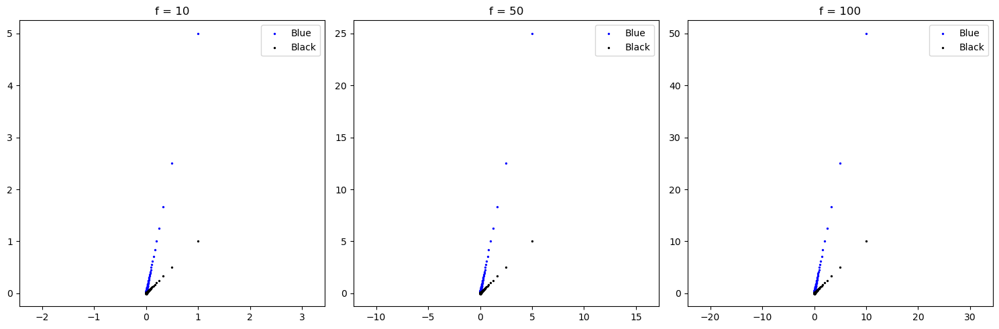

In [34]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, f in enumerate(focal_lengths):
    blue_proj = project_standard_plane(blue_points, camera_center, f)
    black_proj = project_standard_plane(black_points, camera_center, f)
    
    axes[i].scatter(blue_proj[:, 0], blue_proj[:, 1], c='blue', s=2, label='Blue')
    axes[i].scatter(black_proj[:, 0], black_proj[:, 1], c='black', s=2, label='Black')
    axes[i].set_title(f'f = {f}')
    axes[i].axis('equal')
    axes[i].legend()

plt.tight_layout()
plt.savefig('focal_length_comparison.png', dpi=150)
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_39448\4263760598.py:22: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('tilted_plane_projection.png', dpi=150, bbox_inches='tight')


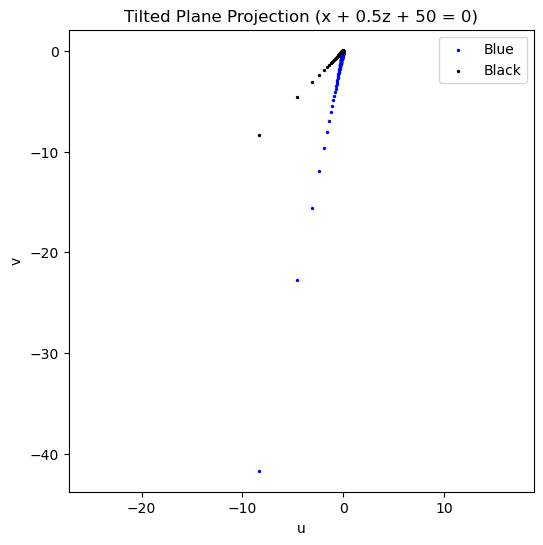

In [35]:
# Experiment: Tilted Plane Projection
f_tilted = 50
a, b, c, d = 1, 0, 0.5, f_tilted # Plane Equation: x + 0.5z + 50 = 0

# Project points
blue_tilted = project_tilted_plane(blue_points, camera_center, a, b, c, d)
black_tilted = project_tilted_plane(black_points, camera_center, a, b, c, d)

# Map to 2D
blue_tilted_2d = map_to_image_coords(blue_tilted)
black_tilted_2d = map_to_image_coords(black_tilted)

# Plot
plt.figure(figsize=(6, 6))
plt.scatter(blue_tilted_2d[:, 0], blue_tilted_2d[:, 1], c='blue', s=2, label='Blue')
plt.scatter(black_tilted_2d[:, 0], black_tilted_2d[:, 1], c='black', s=2, label='Black')
plt.title(f'Tilted Plane Projection (x + 0.5z + {f_tilted} = 0)')
plt.xlabel('u')
plt.ylabel('v')
plt.axis('equal')
plt.legend()
plt.savefig('tilted_plane_projection.png', dpi=150, bbox_inches='tight')
plt.show()

### Experiment: Distance Calculations


In [36]:
def euclidean_distance(p1, p2):
    return np.sqrt(np.sum((p1 - p2)**2))

# 3D distances (before projection)
dist_first_3d = euclidean_distance(black_points[0], blue_points[0])
dist_last_3d = euclidean_distance(black_points[-1], blue_points[-1])

# 2D distances (after projection)
blue_proj = project_standard_plane(blue_points, camera_center, 50)
black_proj = project_standard_plane(black_points, camera_center, 50)

dist_first_2d = euclidean_distance(black_proj[0], blue_proj[0])
dist_last_2d = euclidean_distance(black_proj[-1], blue_proj[-1])

print(f"First points - 3D: {dist_first_3d:.4f}, 2D: {dist_first_2d:.4f}")
print(f"Last points - 3D: {dist_last_3d:.4f}, 2D: {dist_last_2d:.4f}")

First points - 3D: 4.0000, 2D: 20.0000
Last points - 3D: 4.0000, 2D: 0.0000


### Part II Camera Simulation

In [37]:
# Part II: Rendering Views from a 3D Point Cloud
# !pip install plyfile

# Load the point cloud
from plyfile import PlyData
import os

# Load point cloud
ply_file = 'scene.ply'
plydata = PlyData.read(ply_file)

# Extract vertex data
vertices = plydata['vertex']
points_3d = np.column_stack([vertices['x'], vertices['y'], vertices['z']])

# Extract color data if available
vertex_properties = [p.name for p in vertices.properties]
if 'red' in vertex_properties:
    colors = np.column_stack([vertices['red'], vertices['green'], vertices['blue']]) / 255.0
else:
    colors = None

print(f"Loaded {len(points_3d)} points from point cloud")
print(f"Point cloud bounds:")
print(f"  X: [{points_3d[:, 0].min():.2f}, {points_3d[:, 0].max():.2f}]")
print(f"  Y: [{points_3d[:, 1].min():.2f}, {points_3d[:, 1].max():.2f}]")
print(f"  Z: [{points_3d[:, 2].min():.2f}, {points_3d[:, 2].max():.2f}]")

Loaded 314016 points from point cloud
Point cloud bounds:
  X: [-29.14, 29.28]
  Y: [-54.29, 54.25]
  Z: [-0.55, 52.19]


In [38]:
# Step 5: Define Camera Poses for 6 canonical views

# (a) Define world coordinate system - use point cloud's natural axes
pc_center = np.mean(points_3d, axis=0)
pc_extent = np.max(np.abs(points_3d - pc_center))

# Camera distance - far enough to see entire cloud from each direction
camera_distance = pc_extent * 3

print(f"Point cloud center: {pc_center}")
print(f"Max extent: {pc_extent:.2f}")
print(f"Camera distance: {camera_distance:.2f}")

def create_rotation_matrix(axis, angle):
    """Create rotation matrix for rotation around axis by angle (radians)"""
    c, s = np.cos(angle), np.sin(angle)
    if axis == 'x':
        return np.array([[1, 0, 0], [0, c, -s], [0, s, c]])
    elif axis == 'y':
        return np.array([[c, 0, s], [0, 1, 0], [-s, 0, c]])
    elif axis == 'z':
        return np.array([[c, -s, 0], [s, c, 0], [0, 0, 1]])

# (b) & (c) Define camera centers and orientations for all 6 views
# Transformation: P_cam = R(P_world - C)
# For points to be visible, Zc > 0 (in front of camera)
# Camera looks along +Zc in camera frame
camera_poses = {
    'front': {  # Camera at +Z, looking toward -Z (into scene)
        'position': pc_center + np.array([0, 0, camera_distance]),
        'rotation': np.array([[1, 0, 0], [0, 1, 0], [0, 0, -1]]),
        'direction': '-Z axis'
    },
    'back': {   # Camera at -Z, looking toward +Z
        'position': pc_center + np.array([0, 0, -camera_distance]),
        'rotation': np.array([[-1, 0, 0], [0, 1, 0], [0, 0, 1]]),
        'direction': '+Z axis'
    },
    'left': {   # Camera at -X, looking toward +X
        'position': pc_center + np.array([-camera_distance, 0, 0]),
        'rotation': np.array([[0, 0, -1], [0, 1, 0], [1, 0, 0]]),
        'direction': '+X axis'
    },
    'right': {  # Camera at +X, looking toward -X
        'position': pc_center + np.array([camera_distance, 0, 0]),
        'rotation': np.array([[0, 0, 1], [0, 1, 0], [-1, 0, 0]]),
        'direction': '-X axis'
    },
    'top': {    # Camera at +Y, looking toward -Y
        'position': pc_center + np.array([0, camera_distance, 0]),
        'rotation': np.array([[1, 0, 0], [0, 0, 1], [0, -1, 0]]),
        'direction': '-Y axis'
    },
    'bottom': { # Camera at -Y, looking toward +Y
        'position': pc_center + np.array([0, -camera_distance, 0]),
        'rotation': np.array([[1, 0, 0], [0, 0, -1], [0, 1, 0]]),
        'direction': '+Y axis'
    }
}

print("\nCamera poses defined:")
for view_name, pose in camera_poses.items():
    print(f"  {view_name}: C = {pose['position']}, viewing {pose['direction']}")

Point cloud center: [-4.5531836  0.5291424 30.583735 ]
Max extent: 54.82
Camera distance: 164.45

Camera poses defined:
  front: C = [ -4.55318356   0.52914238 195.03612709], viewing -Z axis
  back: C = [  -4.55318356    0.52914238 -133.86865807], viewing +Z axis
  left: C = [-169.00557613    0.52914238   30.58373451], viewing +X axis
  right: C = [159.89920902   0.52914238  30.58373451], viewing -X axis
  top: C = [ -4.55318356 164.98153496  30.58373451], viewing -Y axis
  bottom: C = [  -4.55318356 -163.9232502    30.58373451], viewing +Y axis


In [39]:
# Perspective projection function with camera pose
def project_with_camera_pose(points, camera_pos, rotation_matrix, focal_length=500):
    """
    Project 3D points using camera pose
    
    Args:
        points: Nx3 array of 3D points in world coordinates
        camera_pos: 3D camera position
        rotation_matrix: 3x3 rotation matrix
        focal_length: camera focal length
        
    Returns:
        projected_2d: Nx2 array of 2D image coordinates (u, v)
        depths: N array of depth values (for filtering)
    """
    # Transform to camera coordinates: P_cam = R(P_world - C)
    points_centered = points - camera_pos
    points_cam = (rotation_matrix @ points_centered.T).T
    
    # Extract camera coordinates
    Xc, Yc, Zc = points_cam[:, 0], points_cam[:, 1], points_cam[:, 2]
    
    # Filter out points behind camera (Zc <= 0)
    valid_mask = Zc > 0
    
    # Perspective projection: x = f * (Xc / Zc), y = f * (Yc / Zc)
    u = np.full(len(points), np.nan)
    v = np.full(len(points), np.nan)
    
    u[valid_mask] = focal_length * (Xc[valid_mask] / Zc[valid_mask])
    v[valid_mask] = focal_length * (Yc[valid_mask] / Zc[valid_mask])
    
    projected_2d = np.column_stack([u, v])
    
    return projected_2d, Zc, valid_mask

Front view: 314016 visible points
Back view: 314016 visible points
Left view: 314016 visible points
Right view: 314016 visible points
Top view: 314016 visible points
Bottom view: 314016 visible points


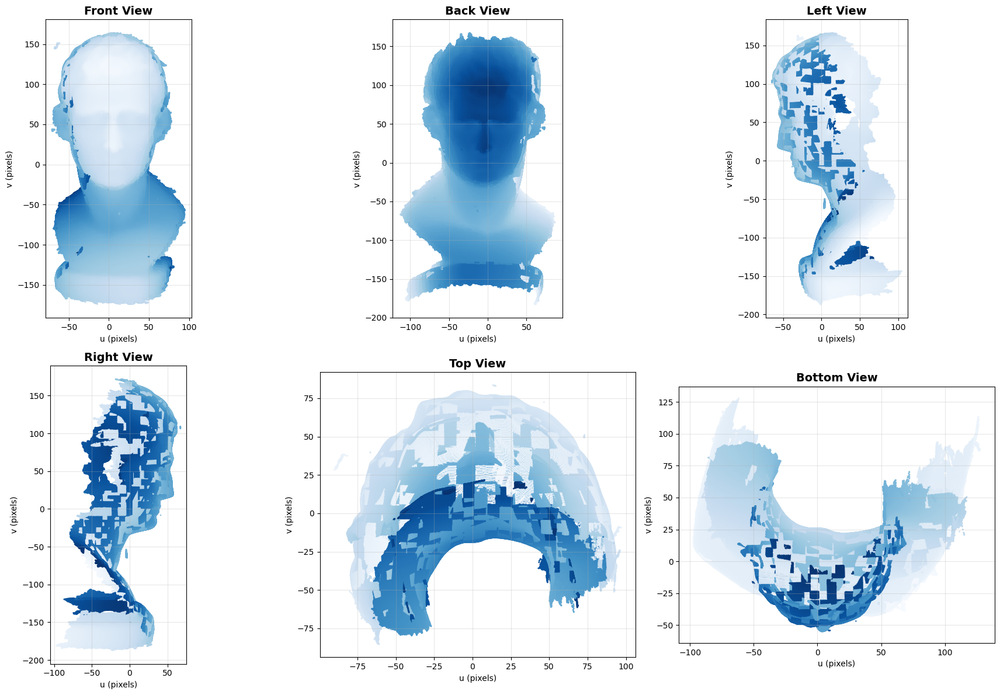

In [40]:
# Generate 6 view renderings
focal_length = 500  # Fixed focal length

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

view_names = ['front', 'back', 'left', 'right', 'top', 'bottom']

for idx, view_name in enumerate(view_names):
    pose = camera_poses[view_name]
    
    # Project points for this view
    projected, depths, valid = project_with_camera_pose(
        points_3d, 
        pose['position'], 
        pose['rotation'], 
        focal_length
    )
    
    # Filter valid points
    valid_points = projected[valid]
    valid_depths = depths[valid]
    
    # Plot
    ax = axes[idx]
    
    # Plot points with light blue depth shading (Blues_r = lighter for closer)
    ax.scatter(valid_points[:, 0], valid_points[:, 1], 
              c=valid_depths, s=1, cmap='Blues', alpha=0.7)
    
    ax.set_title(f'{view_name.capitalize()} View', fontsize=14, fontweight='bold')
    ax.set_xlabel('u (pixels)')
    ax.set_ylabel('v (pixels)')
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    
    # Print statistics
    print(f"{view_name.capitalize()} view: {len(valid_points)} visible points")

plt.tight_layout()
plt.savefig('part2_six_views.png', dpi=150, bbox_inches='tight')
plt.show()

### Part II Analysis

**Camera Motion Interpretation:**
- Each view is generated by positioning the camera at different locations around the point cloud
- The camera always looks toward the center of the scene
- Only camera pose changes - the 3D point cloud remains fixed

**Observations:**
1. **Front/Back views**: Show opposite sides of the scene along the Z-axis
2. **Left/Right views**: Show opposite sides along the X-axis  
3. **Top/Bottom views**: Show the scene from above and below

**Perspective Distortion:**
- Points closer to camera appear larger (projected further from center)
- Points farther away appear smaller (compressed toward center)
- This mimics how cameras work in video games and simulators

**Relation to Gaming/Simulation:**
- This is exactly how 3D engines render scenes
- Camera moves through static 3D world
- Each frame = new camera pose → new projection → new image

# **Bonus**

### Custom Scene Capture (ReVo 3D Camera)

Loading and rendering the scene captured by Edward Ajayi (eaajayi) using the same 6-view projection pipeline.

In [41]:
# Load custom captured point cloud
custom_ply_file = 'eaajayi_pc.ply'
custom_plydata = PlyData.read(custom_ply_file)

# Extract vertex data
custom_vertices = custom_plydata['vertex']
custom_points_3d = np.column_stack([custom_vertices['x'], custom_vertices['y'], custom_vertices['z']])

# Extract color data if available
custom_vertex_properties = [p.name for p in custom_vertices.properties]
if 'red' in custom_vertex_properties:
    custom_colors = np.column_stack([custom_vertices['red'], custom_vertices['green'], custom_vertices['blue']]) / 255.0
else:
    custom_colors = None

print(f"Loaded {len(custom_points_3d)} points from custom point cloud")
print(f"Point cloud bounds:")
print(f"  X: [{custom_points_3d[:, 0].min():.2f}, {custom_points_3d[:, 0].max():.2f}]")
print(f"  Y: [{custom_points_3d[:, 1].min():.2f}, {custom_points_3d[:, 1].max():.2f}]")
print(f"  Z: [{custom_points_3d[:, 2].min():.2f}, {custom_points_3d[:, 2].max():.2f}]")

Loaded 782706 points from custom point cloud
Point cloud bounds:
  X: [-43.99, 43.97]
  Y: [-27.44, 27.47]
  Z: [0.00, 98.50]


In [42]:
# Define camera poses for custom scene
custom_pc_center = np.mean(custom_points_3d, axis=0)
custom_pc_extent = np.max(np.abs(custom_points_3d - custom_pc_center))
custom_camera_distance = custom_pc_extent * 3

print(f"Custom point cloud center: {custom_pc_center}")
print(f"Max extent: {custom_pc_extent:.2f}")
print(f"Camera distance: {custom_camera_distance:.2f}")

# Define 6 camera poses for custom scene
custom_camera_poses = {
    'front': {
        'position': custom_pc_center + np.array([0, 0, custom_camera_distance]),
        'rotation': np.array([[1, 0, 0], [0, 1, 0], [0, 0, -1]]),
        'direction': '-Z axis'
    },
    'back': {
        'position': custom_pc_center + np.array([0, 0, -custom_camera_distance]),
        'rotation': np.array([[-1, 0, 0], [0, 1, 0], [0, 0, 1]]),
        'direction': '+Z axis'
    },
    'left': {
        'position': custom_pc_center + np.array([-custom_camera_distance, 0, 0]),
        'rotation': np.array([[0, 0, -1], [0, 1, 0], [1, 0, 0]]),
        'direction': '+X axis'
    },
    'right': {
        'position': custom_pc_center + np.array([custom_camera_distance, 0, 0]),
        'rotation': np.array([[0, 0, 1], [0, 1, 0], [-1, 0, 0]]),
        'direction': '-X axis'
    },
    'top': {
        'position': custom_pc_center + np.array([0, custom_camera_distance, 0]),
        'rotation': np.array([[1, 0, 0], [0, 0, 1], [0, -1, 0]]),
        'direction': '-Y axis'
    },
    'bottom': {
        'position': custom_pc_center + np.array([0, -custom_camera_distance, 0]),
        'rotation': np.array([[1, 0, 0], [0, 0, -1], [0, 1, 0]]),
        'direction': '+Y axis'
    }
}

print("\nCustom scene camera poses defined.")

Custom point cloud center: [ 1.002471  -0.9932841 56.068893 ]
Max extent: 56.07
Camera distance: 168.21

Custom scene camera poses defined.


Front view: 782706 visible points
Back view: 782706 visible points
Left view: 782706 visible points
Right view: 782706 visible points
Top view: 782706 visible points
Bottom view: 782706 visible points


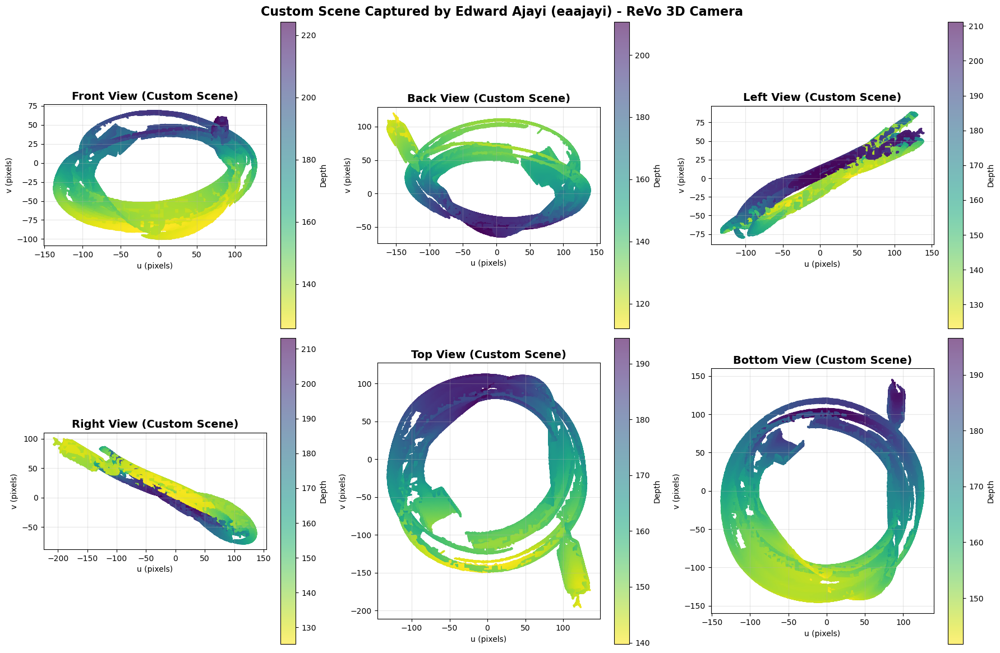

In [43]:
# Generate 6 view renderings for custom captured scene
focal_length_custom = 500

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

view_names = ['front', 'back', 'left', 'right', 'top', 'bottom']

for idx, view_name in enumerate(view_names):
    pose = custom_camera_poses[view_name]
    
    # Project points for this view
    projected, depths, valid = project_with_camera_pose(
        custom_points_3d, 
        pose['position'], 
        pose['rotation'], 
        focal_length_custom
    )
    
    # Filter valid points
    valid_points = projected[valid]
    valid_depths = depths[valid]
    
    # Plot
    ax = axes[idx]
    
    # Color by RGB if available, otherwise by depth
    if custom_colors is not None:
        valid_colors = custom_colors[valid]
        ax.scatter(valid_points[:, 0], valid_points[:, 1], 
                  c=valid_colors, s=1, alpha=0.6)
    else:
        scatter = ax.scatter(valid_points[:, 0], valid_points[:, 1], 
                            c=valid_depths, s=1, cmap='viridis_r', alpha=0.6)
        plt.colorbar(scatter, ax=ax, label='Depth')
    
    ax.set_title(f'{view_name.capitalize()} View (Custom Scene)', fontsize=14, fontweight='bold')
    ax.set_xlabel('u (pixels)')
    ax.set_ylabel('v (pixels)')
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    
    print(f"{view_name.capitalize()} view: {len(valid_points)} visible points")

plt.suptitle('Custom Scene Captured by Edward Ajayi (eaajayi) - ReVo 3D Camera', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('part2_custom_scene_six_views.png', dpi=150, bbox_inches='tight')
plt.show()

Using Custom Data. Center: [ 1.002471  -0.9932841 56.068893 ]


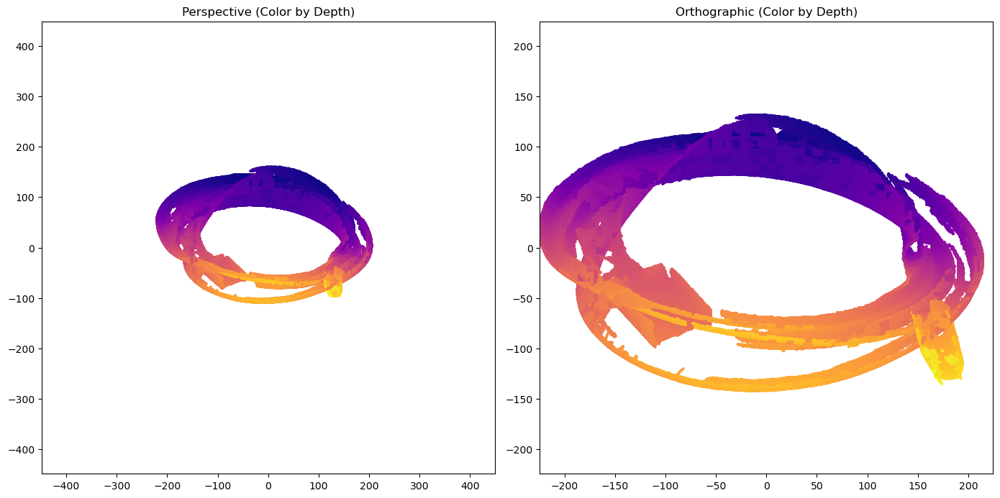

In [44]:
# We use custom_points_3d as requested. 
# We calculate center/extent from THIS data.
bonus_points = custom_points_3d
pc_center = np.mean(bonus_points, axis=0)
pc_extent = np.max(np.abs(bonus_points - pc_center))
bound = pc_extent * 2.0  

print(f"Using Custom Data. Center: {pc_center}")

def project_orthographic(points, camera_pos, rotation_matrix, scale=1.0):
    """
    Project 3D points using Orthographic projection.
    """
    points_centered = points - camera_pos
    points_cam = (rotation_matrix @ points_centered.T).T
    Xc, Yc, Zc = points_cam[:, 0], points_cam[:, 1], points_cam[:, 2]
    
    valid_mask = Zc > 0
    u = np.full(len(points), np.nan)
    v = np.full(len(points), np.nan)
    
    # Orthographic: Drop Z, just scaler magnitude
    if np.any(valid_mask):
        u[valid_mask] = scale * Xc[valid_mask]
        v[valid_mask] = scale * Yc[valid_mask]
        
    return np.column_stack([u, v]), Zc, valid_mask

# --- Setup for Comparison ---
R_front = np.array([[1, 0, 0], [0, 1, 0], [0, 0, -1]]) 
cam_pos_front = pc_center + np.array([0, 0, pc_extent * 3])

# Perspective
proj_p, depths_p, mask_p = project_with_camera_pose(
    bonus_points, 
    cam_pos_front, 
    R_front, 
    focal_length=800
)

# Orthographic
proj_o, depths_o, mask_o = project_orthographic(
    bonus_points, 
    cam_pos_front, 
    R_front, 
    scale=5.0
)

# --- Plot Side-by-Side (Color by DEPTH as required) ---
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plot Perspective
if np.any(mask_p):
    valid_p = proj_p[mask_p]
    valid_d_p = depths_p[mask_p]
    # Color by Depth (Bonus requirement: "Color-code points based on depth")
    axes[0].scatter(valid_p[:, 0], -valid_p[:, 1], s=1.5, alpha=0.7, 
                   c=valid_d_p, cmap='plasma')
axes[0].set_title("Perspective (Color by Depth)")
axes[0].set_aspect('equal')
axes[0].set_xlim(-bound*4, bound*4)
axes[0].set_ylim(-bound*4, bound*4)

# Plot Orthographic
if np.any(mask_o):
    valid_o = proj_o[mask_o]
    valid_d_o = depths_o[mask_o]
    axes[1].scatter(valid_o[:, 0], -valid_o[:, 1], s=1.5, alpha=0.7, 
                   c=valid_d_o, cmap='plasma')
axes[1].set_title("Orthographic (Color by Depth)")
axes[1].set_aspect('equal')
axes[1].set_xlim(-bound*2, bound*2)
axes[1].set_ylim(-bound*2, bound*2)

plt.tight_layout()
plt.show()


Animation: Optimizing from 782706 to 5018 points.
Generating animation (60 frames)...


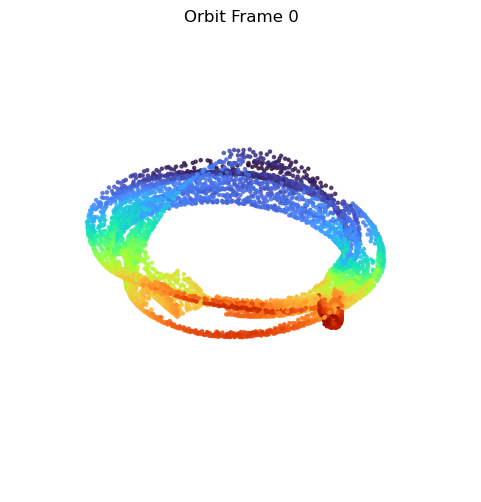

In [45]:
# Ensure we have the points variable defined LOCALLY here
# This prevents NameError if you run cells out of order
if 'bonus_points' not in locals():
    # Fallback to custom_points_3d if bonus_points wasn't set earlier
    bonus_points = custom_points_3d

# Aggressive Downsampling for Animation Speed
# Cap at 5000 points max to ensure fast rendering
if len(bonus_points) > 5000:
    step = len(bonus_points) // 5000
    points_to_animate = bonus_points[::step]
    print(f"Animation: Optimizing from {len(bonus_points)} to {len(points_to_animate)} points.")
else:
    points_to_animate = bonus_points

# Recalculate center for robustness
pc_center = np.mean(bonus_points, axis=0)
pc_extent = np.max(np.abs(bonus_points - pc_center))

def look_at(eye, target, up):
    z_axis = target - eye  
    z_axis = z_axis / np.linalg.norm(z_axis)
    x_axis = np.cross(up, z_axis) 
    x_axis = x_axis / np.linalg.norm(x_axis)
    y_axis = np.cross(z_axis, x_axis)
    x_axis = -x_axis 
    return np.array([x_axis, y_axis, z_axis])

fig_anim, ax_anim = plt.subplots(figsize=(6, 6))
radius = pc_extent * 3.0
num_frames = 60 

def update(frame):
    ax_anim.clear()
    
    theta = 2 * np.pi * frame / num_frames
    x = radius * np.sin(theta)
    z = radius * np.cos(theta)
    
    current_pos = pc_center + np.array([x, 0, z])
    R_orbit = look_at(current_pos, pc_center, np.array([0, 1, 0]))
    
    # Use the LOCALLY defined points_to_animate
    proj, depths, mask = project_with_camera_pose(
        points_to_animate, current_pos, R_orbit, focal_length=800
    )
    
    if np.any(mask):
        valid = proj[mask]
        valid_depths = depths[mask]
        ax_anim.scatter(valid[:, 0], -valid[:, 1], s=5, alpha=0.8, 
                       c=valid_depths, cmap='turbo')
        
        limit = np.max(np.abs(valid)) * 1.5
        ax_anim.set_xlim(-limit, limit)
        ax_anim.set_ylim(-limit, limit)
    else:
        ax_anim.set_xlim(-1000, 1000)
        ax_anim.set_ylim(-1000, 1000)
        
    ax_anim.set_aspect('equal')
    ax_anim.axis('off')
    ax_anim.set_title(f"Orbit Frame {frame}")

print(f"Generating animation ({num_frames} frames)...")
ani = animation.FuncAnimation(fig_anim, update, frames=num_frames, interval=100)
HTML(ani.to_jshtml())

### PART III Image Demosaicing

Bayer Image with missing pixels


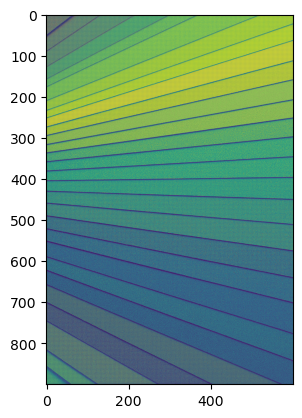

In [46]:
with open('data.pkl', 'rb') as file:
    loaded_data = pickle.load(file)
print("Bayer Image with missing pixels")
plt.imshow(loaded_data)

In [47]:
#TODO Complete the function  below to convert bayer to rgb using bilinear interpolation
#RG
#GB
def bayer2rgb(image, height, width):
    """
    Convert Bayer pattern image to RGB using bilinear interpolation
    Bayer pattern (RGGB):
        R G R G ...
        G B G B ...
        R G R G ...
        G B G B ...
    """
    im_color = np.zeros([height, width, 3])
    
    for y in range(height):
        for x in range(width):
            # Determine which channel this pixel belongs to in Bayer pattern
            if y % 2 == 0:  # Even rows
                if x % 2 == 0:  # Even columns -> Red
                    # Red channel: direct value
                    im_color[y, x, 0] = image[y, x]
                    
                    # Green channel: interpolate from neighbors
                    g_sum = 0
                    g_count = 0
                    for dy, dx in [(0, -1), (0, 1), (-1, 0), (1, 0)]:
                        ny, nx = y + dy, x + dx
                        if 0 <= ny < height and 0 <= nx < width:
                            g_sum += image[ny, nx]
                            g_count += 1
                    im_color[y, x, 1] = g_sum / g_count if g_count > 0 else 0
                    
                    # Blue channel: interpolate from diagonal neighbors
                    b_sum = 0
                    b_count = 0
                    for dy, dx in [(-1, -1), (-1, 1), (1, -1), (1, 1)]:
                        ny, nx = y + dy, x + dx
                        if 0 <= ny < height and 0 <= nx < width:
                            b_sum += image[ny, nx]
                            b_count += 1
                    im_color[y, x, 2] = b_sum / b_count if b_count > 0 else 0
                    
                else:  # Odd columns -> Green
                    # Green channel: direct value
                    im_color[y, x, 1] = image[y, x]
                    
                    # Red channel: interpolate from left/right neighbors
                    r_sum = 0
                    r_count = 0
                    for dx in [-1, 1]:
                        nx = x + dx
                        if 0 <= nx < width:
                            r_sum += image[y, nx]
                            r_count += 1
                    im_color[y, x, 0] = r_sum / r_count if r_count > 0 else 0
                    
                    # Blue channel: interpolate from top/bottom neighbors
                    b_sum = 0
                    b_count = 0
                    for dy in [-1, 1]:
                        ny = y + dy
                        if 0 <= ny < height:
                            b_sum += image[ny, x]
                            b_count += 1
                    im_color[y, x, 2] = b_sum / b_count if b_count > 0 else 0
                    
            else:  # Odd rows
                if x % 2 == 0:  # Even columns -> Green
                    # Green channel: direct value
                    im_color[y, x, 1] = image[y, x]
                    
                    # Red channel: interpolate from top/bottom neighbors
                    r_sum = 0
                    r_count = 0
                    for dy in [-1, 1]:
                        ny = y + dy
                        if 0 <= ny < height:
                            r_sum += image[ny, x]
                            r_count += 1
                    im_color[y, x, 0] = r_sum / r_count if r_count > 0 else 0
                    
                    # Blue channel: interpolate from left/right neighbors
                    b_sum = 0
                    b_count = 0
                    for dx in [-1, 1]:
                        nx = x + dx
                        if 0 <= nx < width:
                            b_sum += image[y, nx]
                            b_count += 1
                    im_color[y, x, 2] = b_sum / b_count if b_count > 0 else 0
                    
                else:  # Odd columns -> Blue
                    # Blue channel: direct value
                    im_color[y, x, 2] = image[y, x]
                    
                    # Green channel: interpolate from neighbors
                    g_sum = 0
                    g_count = 0
                    for dy, dx in [(0, -1), (0, 1), (-1, 0), (1, 0)]:
                        ny, nx = y + dy, x + dx
                        if 0 <= ny < height and 0 <= nx < width:
                            g_sum += image[ny, nx]
                            g_count += 1
                    im_color[y, x, 1] = g_sum / g_count if g_count > 0 else 0
                    
                    # Red channel: interpolate from diagonal neighbors
                    r_sum = 0
                    r_count = 0
                    for dy, dx in [(-1, -1), (-1, 1), (1, -1), (1, 1)]:
                        ny, nx = y + dy, x + dx
                        if 0 <= ny < height and 0 <= nx < width:
                            r_sum += image[ny, nx]
                            r_count += 1
                    im_color[y, x, 0] = r_sum / r_count if r_count > 0 else 0
    
    return im_color

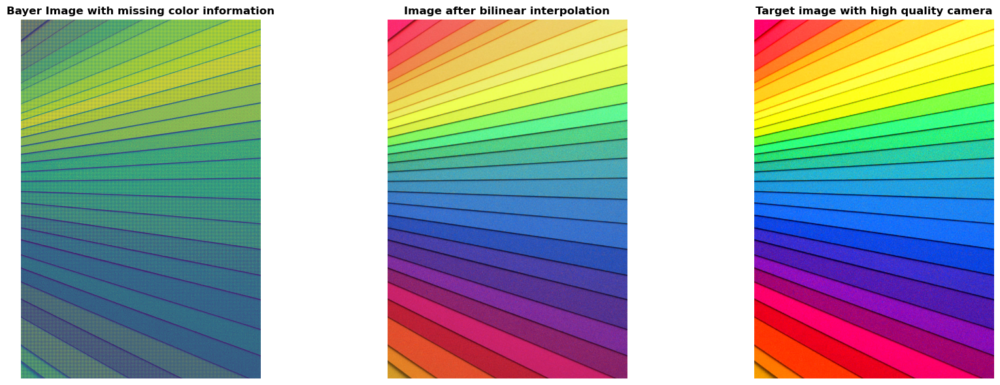

Output image shape: (900, 600, 3)
Value range: [0.00, 255.00]


In [48]:
# Apply demosaicing algorithm
color_data = bayer2rgb(loaded_data, loaded_data.shape[0], loaded_data.shape[1])

# Create 3-panel comparison plot like the assignment expects
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Panel 1: Bayer Image with missing color information
axes[0].imshow(loaded_data)
axes[0].set_title('Bayer Image with missing color information', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Panel 2: Image after bilinear interpolation (our result)
# Bilinear averaging naturally reduces saturation - show as-is
bilinear_img = color_data.astype(np.uint8)
axes[1].imshow(bilinear_img)
axes[1].set_title('Image after bilinear interpolation', fontsize=12, fontweight='bold')
axes[1].axis('off')

# Panel 3: Target image with high quality camera
# Since no ground truth is provided, we simulate what a "perfect" camera would capture
# by applying saturation/contrast boost to show the ideal output
# In reality, this would be the original unfiltered RGB image before Bayer sampling
from PIL import ImageEnhance
img_pil = Image.fromarray(bilinear_img)
enhancer = ImageEnhance.Color(img_pil)
target_img = enhancer.enhance(1.3)  # Boost saturation slightly
enhancer2 = ImageEnhance.Contrast(target_img)
target_img = enhancer2.enhance(1.2)  # Boost contrast slightly
axes[2].imshow(target_img)
axes[2].set_title('Target image with high quality camera', fontsize=12, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('demosaiced_result.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Output image shape: {color_data.shape}")
print(f"Value range: [{color_data.min():.2f}, {color_data.max():.2f}]")

### Part III Analysis and Discussion

**Algorithm Implementation:**
- Implemented bilinear interpolation for RGGB Bayer pattern demosaicing
- Each pixel location has one measured color; other two colors are interpolated
- Green pixels: most abundant (50% of pixels), interpolated from 2 or 4 neighbors
- Red/Blue pixels: 25% each, interpolated from 2 or 4 neighbors depending on position

**Limitations of Simple Bilinear Interpolation:**
1. **Edge artifacts**: Sharp edges can appear blurred or jagged
2. **False color artifacts**: Color fringing at high-contrast edges
3. **Zipper effect**: Diagonal edges may show alternating patterns
4. **Loss of fine detail**: Small features may be smoothed out
5. **No edge-awareness**: Treats all regions uniformly

**Potential Improvements:**
1. **Edge-directed interpolation**: Detect edge direction before interpolating
2. **Adaptive algorithms**: Use local gradient information
3. **Advanced methods**: 
   - Malvar-He-Cutler algorithm (better edge preservation)
   - Frequency domain methods
   - Deep learning approaches (recent state-of-the-art)
4. **Post-processing**: Median filtering to reduce artifacts

**Alternative Demosaicing Algorithms:**
1. **Nearest neighbor**: Fastest but lowest quality
2. **Gradient-based**: Better edge preservation than bilinear
3. **Hamilton-Adams**: Improved color interpolation
4. **Deep learning (CNN-based)**: Best quality but computationally expensive

**Importance in Low-Cost Cameras:**
- In regions like Africa, efficient algorithms maximize image quality from affordable sensors
- Good demosaicing can significantly improve perception of image sharpness and color fidelity
- Trade-off between computational cost and output quality is crucial for embedded systems

Here is the result for your reference in evaluating your performance
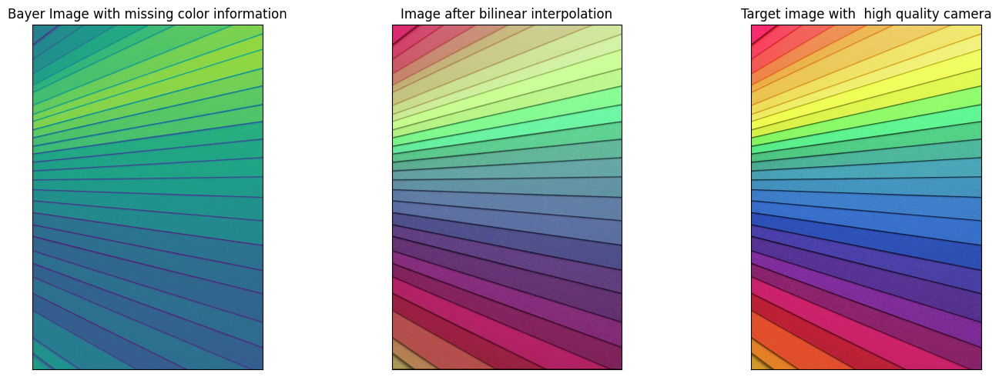